# **1. Import Library**

In [1]:
!pip install --upgrade --force-reinstall numpy gensim

  Using cached numpy-2.2.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (62 kB)
  Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (8.1 kB)
  Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (61 kB)
  Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)
  Using cached smart_open-7.1.0-py3-none-any.whl.metadata (24 kB)
  Using cached wrapt-1.17.2-cp311-cp311-manylinux_2_5_x86_64.manylinux1_x86_64.manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (6.4 kB)
Using cached gensim-4.3.3-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (26.7 MB)
Using cached numpy-1.26.4-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (18.3 MB)
Using cached scipy-1.13.1-cp311-cp311-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (38.6 MB)
Using cached smart_open-7.1.0-py3-none-any.whl (61 kB)
Using cached wrapt-1.17.2-cp311-cp

Setelah run kode diatas mulai ulang dan jalankan kembali (Restart and Run All). Hal ini dikarenakan saya menggunakan numpy versi di bawah 2 untuk bisa menggunakan ekstraksi fitur Word2Vec dengan baik. Jika tidak di Restart, maka akan ada eror karena perbedaan versi library

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
import re
import string
import csv
import requests
from io import StringIO

import nltk
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('punkt')
nltk.download('stopwords')

!pip install sastrawi
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory
from Sastrawi.StopWordRemover.StopWordRemoverFactory import StopWordRemoverFactory

from wordcloud import WordCloud
from google.colab import files
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.ensemble import RandomForestClassifier
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.layers import Embedding, Conv1D, MaxPooling1D, Bidirectional, LSTM, GRU, Dense, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, Callback
from gensim.models import Word2Vec
import pickle
pd.options.mode.chained_assignment = None
seed = 0
np.random.seed(seed)
nltk.download('punkt_tab')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 209.7/209.7 kB 9.0 MB/s eta 0:00:00


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt_tab.zip.


True

# **2. Memuat Dataset**

In [3]:
files.upload()

Saving data_ulasan.csv to data_ulasan.csv


{'data_ulasan.csv': b'content,score,thumbsUpCount,reviewCreatedVersion\n"apknya udah bagus, tapi menurutku ada beberapa hall yg bisa di ganti. kayak mungkin warnanya bagroundnya bisa putih aja terus pilihannya yg biru. supaya keliatan lebih simple. lalu mungkin ada di kasih notifikasi kalau misalnya ada uang yg di tarik, ketariknya karna apa, dll. terus saldonya buat keliatan di atas gitu kaya apk e-wallet, supaya gak ribet kalau mau cek saldo harus tekan sana sini lagi. itu aja sih. supaya apk nya keliatan lebih cantik",4,4,4.6.1\n"Di Update minta verifikasi ulang gagal terus, mana harus pakai pulsa lokal buat SMS, dicoba berulang\xc2\xb2 pakai No. Ponsel terdaftar BCA tidak bisa\xe2\x9d\x97sudah di slot sim card 1 & paket yg di gunakan juga paket data kartu yang terdaftar s/d mencoba verifikasi di lain tempat tetap tidak bisa, ampun dah menyusahkan setelah di update maupun app di delete untuk kembali di download & kembali di vertifikasi hasilnya sama saja \xf0\x9f\x91\x8e",1,42,4.6.1

In [4]:
df = pd.read_csv('data_ulasan.csv')

# **3. Exploratory Data Analysis (EDA)**

In [5]:
df

,content,score,thumbsUpCount,reviewCreatedVersion
0,"apknya udah bagus, tapi menurutku ada beberapa...",4,4,4.6.1
1,"Di Update minta verifikasi ulang gagal terus, ...",1,42,4.6.1
2,Sudah lama pake aplikasi ini Alhamdulillah san...,3,8,4.6.0
3,Untuk aplikasi berjalan sangat baik dan mudah ...,5,254,4.5.7
4,Astaga.. ribet banget.. baru pertama kali inst...,1,244,4.5.9
...,...,...,...,...
143995,Sangat membantu,5,0,4.2.6
143996,Sangat membantu,5,0,2.2.4
143997,"Sayang bnget,malu2in Bca aja...PARAHHHHH",1,0,NaN
143998,Keren mempermudah buwat TF,5,0,NaN


In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 144000 entries, 0 to 143999
Data columns (total 4 columns):
 #   Column                Non-Null Count   Dtype 
---  ------                --------------   ----- 
 0   content               144000 non-null  object
 1   score                 144000 non-null  int64 
 2   thumbsUpCount         144000 non-null  int64 
 3   reviewCreatedVersion  117964 non-null  object
dtypes: int64(2), object(2)
memory usage: 4.4+ MB


In [7]:
df.reviewCreatedVersion.value_counts()

,count
reviewCreatedVersion,
1.7.1,4676
2.5.3,4398
2.2.5,3951
1.8.0,3883
2.5.2,3861
...,...
1.4.5,8
1.0.9,8
1.4.0,6


In [8]:
df.isna().sum()

,0
content,0
score,0
thumbsUpCount,0
reviewCreatedVersion,26036


In [9]:
df.duplicated().sum()

10261

In [10]:
df = df.dropna()

In [11]:
df = df.drop_duplicates()

In [12]:
df

,content,score,thumbsUpCount,reviewCreatedVersion
0,"apknya udah bagus, tapi menurutku ada beberapa...",4,4,4.6.1
1,"Di Update minta verifikasi ulang gagal terus, ...",1,42,4.6.1
2,Sudah lama pake aplikasi ini Alhamdulillah san...,3,8,4.6.0
3,Untuk aplikasi berjalan sangat baik dan mudah ...,5,254,4.5.7
4,Astaga.. ribet banget.. baru pertama kali inst...,1,244,4.5.9
...,...,...,...,...
143987,Minta d Update kok maksa ????,1,0,2.4.3
143990,Adain menu beli saham donk kayanya oke,5,0,2.5.3
143992,Cepat n mudah,4,0,2.5.9
143993,Aplikasi yg bagus,5,0,2.3.1


In [13]:
df.isna().sum()

,0
content,0
score,0
thumbsUpCount,0
reviewCreatedVersion,0


In [14]:
df.duplicated().sum()

0

# **4. Data Preprocessing**

In [15]:
def cleaningText(text):
    text = re.sub(r'@[A-Za-z0-9]+', '', text)
    text = re.sub(r'#[A-Za-z0-9]+', '', text)
    text = re.sub(r'RT[\s]', '', text)
    text = re.sub(r"http\S+", '', text)
    text = re.sub(r'[0-9]+', '', text)
    text = re.sub(r'[^\w\s]', '', text)

    text = text.replace('\n', ' ')
    text = text.translate(str.maketrans('', '', string.punctuation))
    text = text.strip(' ')
    return text

def casefoldingText(text):
    text = text.lower()
    return text

def tokenizingText(text):
    text = word_tokenize(text)
    return text

def filteringText(text):
    listStopwords = set(stopwords.words('indonesian'))
    listStopwords1 = set(stopwords.words('english'))
    listStopwords.update(listStopwords1)
    listStopwords.update(['iya','yaa','gak','nya','na','sih','ku',"di","ga","ya","gaa","loh","kah","woi","woii","woy"])
    filtered = []
    for txt in text:
        if txt not in listStopwords:
            filtered.append(txt)
    text = filtered
    return text

def stemmingText(text):
    factory = StemmerFactory()
    stemmer = factory.create_stemmer()
    words = text.split()
    stemmed_words = [stemmer.stem(word) for word in words]
    stemmed_text = ' '.join(stemmed_words)

    return stemmed_text

def toSentence(list_words):
    sentence = ' '.join(word for word in list_words)
    return sentence

slangwords = {"@": "di", "abis": "habis", "wtb": "beli", "masi": "masih", "wts": "jual", "wtt": "tukar", "bgt": "banget", "maks": "maksimal"}
def fix_slangwords(text):
    words = text.split()
    fixed_words = []

    for word in words:
        if word.lower() in slangwords:
            fixed_words.append(slangwords[word.lower()])
        else:
            fixed_words.append(word)

    fixed_text = ' '.join(fixed_words)
    return fixed_text

In [16]:
df['text_clean'] = df['content'].apply(cleaningText)

df['text_casefoldingText'] = df['text_clean'].apply(casefoldingText)

df['text_slangwords'] = df['text_casefoldingText'].apply(fix_slangwords)

df['text_tokenizingText'] = df['text_slangwords'].apply(tokenizingText)

df['text_stopword'] = df['text_tokenizingText'].apply(filteringText)

df['text_akhir'] = df['text_stopword'].apply(toSentence)


In [17]:
def full_preprocessing(text):
    text = cleaningText(text)
    text = casefoldingText(text)
    text = fix_slangwords(text)
    text = tokenizingText(text)
    text = filteringText(text)
    text = toSentence(text)
    return text
df['text_akhir'] = df['content'].apply(full_preprocessing)


In [18]:
df

,content,score,thumbsUpCount,reviewCreatedVersion,text_clean,text_casefoldingText,text_slangwords,text_tokenizingText,text_stopword,text_akhir
0,"apknya udah bagus, tapi menurutku ada beberapa...",4,4,4.6.1,apknya udah bagus tapi menurutku ada beberapa ...,apknya udah bagus tapi menurutku ada beberapa ...,apknya udah bagus tapi menurutku ada beberapa ...,"[apknya, udah, bagus, tapi, menurutku, ada, be...","[apknya, udah, bagus, menurutku, hall, yg, gan...",apknya udah bagus menurutku hall yg ganti kaya...
1,"Di Update minta verifikasi ulang gagal terus, ...",1,42,4.6.1,Di Update minta verifikasi ulang gagal terus m...,di update minta verifikasi ulang gagal terus m...,di update minta verifikasi ulang gagal terus m...,"[di, update, minta, verifikasi, ulang, gagal, ...","[update, verifikasi, ulang, gagal, pakai, puls...",update verifikasi ulang gagal pakai pulsa loka...
2,Sudah lama pake aplikasi ini Alhamdulillah san...,3,8,4.6.0,Sudah lama pake aplikasi ini Alhamdulillah san...,sudah lama pake aplikasi ini alhamdulillah san...,sudah lama pake aplikasi ini alhamdulillah san...,"[sudah, lama, pake, aplikasi, ini, alhamdulill...","[pake, aplikasi, alhamdulillah, membantu, kece...",pake aplikasi alhamdulillah membantu kecewa tr...
3,Untuk aplikasi berjalan sangat baik dan mudah ...,5,254,4.5.7,Untuk aplikasi berjalan sangat baik dan mudah ...,untuk aplikasi berjalan sangat baik dan mudah ...,untuk aplikasi berjalan sangat baik dan mudah ...,"[untuk, aplikasi, berjalan, sangat, baik, dan,...","[aplikasi, berjalan, mudah, menyesalkan, pakai...",aplikasi berjalan mudah menyesalkan pakai data...
4,Astaga.. ribet banget.. baru pertama kali inst...,1,244,4.5.9,Astaga ribet banget baru pertama kali instal a...,astaga ribet banget baru pertama kali instal a...,astaga ribet banget baru pertama kali instal a...,"[astaga, ribet, banget, baru, pertama, kali, i...","[astaga, ribet, banget, kali, instal, terinsta...",astaga ribet banget kali instal terinstal veri...
...,...,...,...,...,...,...,...,...,...,...
143987,Minta d Update kok maksa ????,1,0,2.4.3,Minta d Update kok maksa,minta d update kok maksa,minta d update kok maksa,"[minta, d, update, kok, maksa]","[update, maksa]",update maksa
143990,Adain menu beli saham donk kayanya oke,5,0,2.5.3,Adain menu beli saham donk kayanya oke,adain menu beli saham donk kayanya oke,adain menu beli saham donk kayanya oke,"[adain, menu, beli, saham, donk, kayanya, oke]","[adain, menu, beli, saham, donk, kayanya, oke]",adain menu beli saham donk kayanya oke
143992,Cepat n mudah,4,0,2.5.9,Cepat n mudah,cepat n mudah,cepat n mudah,"[cepat, n, mudah]","[cepat, n, mudah]",cepat n mudah
143993,Aplikasi yg bagus,5,0,2.3.1,Aplikasi yg bagus,aplikasi yg bagus,aplikasi yg bagus,"[aplikasi, yg, bagus]","[aplikasi, yg, bagus]",aplikasi yg bagus


In [19]:
lexicon_positive = dict()

response = requests.get('https://raw.githubusercontent.com/angelmetanosaa/dataset/main/lexicon_positive.csv')

if response.status_code == 200:
    reader = csv.reader(StringIO(response.text), delimiter=',')

    for row in reader:
        lexicon_positive[row[0]] = int(row[1])
else:
    print("Failed to fetch positive lexicon data")

lexicon_negative = dict()

response = requests.get('https://raw.githubusercontent.com/angelmetanosaa/dataset/main/lexicon_negative.csv')

if response.status_code == 200:
    # Jika permintaan berhasil
    reader = csv.reader(StringIO(response.text), delimiter=',')
    for row in reader:
        lexicon_negative[row[0]] = int(row[1])
else:
    print("Failed to fetch negative lexicon data")

In [20]:
def sentiment_analysis_lexicon_indonesia(text):
    score = 0
    for word in text:
        if (word in lexicon_positive):
            score = score + lexicon_positive[word]

    for word in text:
        if (word in lexicon_negative):
            score = score + lexicon_negative[word]

    polarity=''
    if (score > 0):
        polarity = 'positive'
    elif (score < 0):
        polarity = 'negative'

    else:
        polarity = 'neutral'

    return score, polarity

In [21]:
results = df['text_stopword'].apply(sentiment_analysis_lexicon_indonesia)
results = list(zip(*results))
df['polarity_score'] = results[0]
df['polarity'] = results[1]

## **Data Labeling**

final_sentiment
positive    45966
negative    45906
neutral     17874
Name: count, dtype: int64


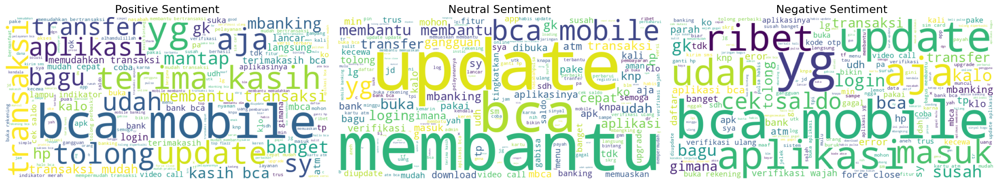

In [22]:
df['thumbsUpCount_norm'] = df['thumbsUpCount'] / df['thumbsUpCount'].max()
df['rating_score'] = df.apply(
    lambda x: x['score'] if x['thumbsUpCount'] < 5 else x['score'] * x['thumbsUpCount_norm'],
    axis=1
)
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df['rating_score_normalized'] = scaler.fit_transform(df[['rating_score']])

df['total_score'] = 0.8 * df['polarity_score'] + 0.2 * df['rating_score_normalized']

def final_sentiment(score):
    if score > 0.5:
        return 'positive'
    elif score < -0.5:
        return 'negative'
    else:
        return 'neutral'

df['final_sentiment'] = df['total_score'].apply(final_sentiment)
print(df['final_sentiment'].value_counts())
from wordcloud import WordCloud
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 3, figsize=(20, 6))  # (rows=1, cols=3)

sentiments = ['positive', 'neutral', 'negative']

for i, sentiment in enumerate(sentiments):
    text = ' '.join(df[df['final_sentiment'] == sentiment]['text_akhir'].astype(str))

    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)

    axes[i].imshow(wordcloud, interpolation='bilinear')
    axes[i].axis('off')
    axes[i].set_title(f'{sentiment.capitalize()} Sentiment', fontsize=16)

plt.tight_layout()
plt.show()


Disini, saya menggunakan ThumbsUpCount untuk memperkuat rating (score), dimana score yang memiliki ThumbsUpCount < 5 tidak saya gunakan untuk memperkuat rating. Memperkuat disini artinya, saya menggunakan rating untuk melakukan weight/beban popularity score agar pembagian Labelnya semakin rata dan baik.

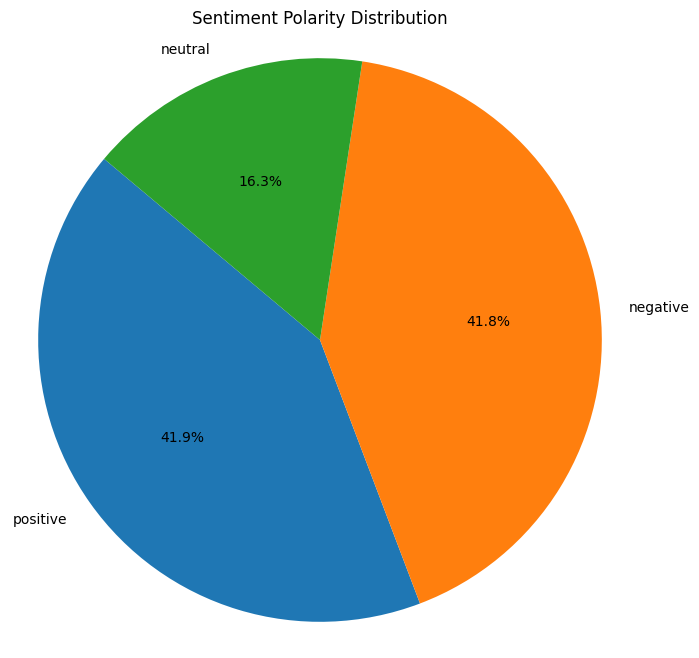

In [23]:
polarity_counts = df['final_sentiment'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(polarity_counts, labels=polarity_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Sentiment Polarity Distribution')
plt.axis('equal')  # Biar pie chart-nya bulat sempurna
plt.show()


# **5. Pembangunan Model**

## **Deep Learning**

In [24]:
X = df['text_akhir']
y = df['final_sentiment']

le = LabelEncoder()
y_encoded = le.fit_transform(y)
n_classes = len(le.classes_)

X_train_raw, X_test_raw, y_train, y_test = train_test_split(X, y_encoded, test_size=0.2, random_state=42)

# Tokenizer (fit only on training data)
vocab_size = 20000
tokenizer = Tokenizer(num_words=vocab_size, oov_token="<OOV>")
tokenizer.fit_on_texts(X_train_raw)

maxlen = 200
X_train_seq = tokenizer.texts_to_sequences(X_train_raw)
X_test_seq = tokenizer.texts_to_sequences(X_test_raw)
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

with open('tokenizer.pkl', 'wb') as f:
    pickle.dump(tokenizer, f)
with open('label_encoder.pkl', 'wb') as f:
    pickle.dump(le, f)


In [25]:
class EarlyStoppingByAccuracy(EarlyStopping):
    def __init__(self, monitor='val_accuracy', value=0.90, verbose=0):
        super(EarlyStoppingByAccuracy, self).__init__(monitor=monitor, verbose=verbose, mode='max', patience=10, restore_best_weights=True)
        self.value = value

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        current = logs.get(self.monitor)
        if current is None:
            return
        if current >= self.value:
            self.stopped_epoch = epoch
            self.model.stop_training = True
            if self.verbose > 0:
                print(f"Epoch {epoch + 1}: early stopping triggered due to reaching {self.monitor} >= {self.value}")

early_stopping_loss = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [26]:
def create_embedding_matrix(tokenizer, embedding_dim, word_vectors):
    embedding_matrix = np.zeros((len(tokenizer.word_index) + 1, embedding_dim))
    for word, i in tokenizer.word_index.items():
        if word in word_vectors:
            embedding_matrix[i] = word_vectors[word]
        else:
            embedding_matrix[i] = np.random.normal(scale=0.6, size=(embedding_dim,))
    return embedding_matrix

### **LSTM + Word2vec**

In [27]:
print("\n--- Training LSTM + Word2Vec Model ---")
tokenized_data_for_w2v_train = [word_tokenize(sentence.lower()) for sentence in X_train_raw]

embedding_dim_w2v = 100
word2vec_model = Word2Vec(
    sentences=tokenized_data_for_w2v_train,
    vector_size=embedding_dim_w2v,
    window=5,
    min_count=1,
    workers=4,
    epochs=30
)

word2vec_vocab = word2vec_model.wv

# Embedding matrix for LSTM + Word2Vec
embedding_matrix_lstm_w2v = create_embedding_matrix(tokenizer, embedding_dim_w2v, word2vec_vocab)

# LSTM Model
model_lstm_w2v = Sequential()
model_lstm_w2v.add(Embedding(
    input_dim=len(tokenizer.word_index) + 1,
    output_dim=embedding_dim_w2v,
    input_length=maxlen,
    weights=[embedding_matrix_lstm_w2v],
    trainable=True
))
model_lstm_w2v.add(LSTM(128, return_sequences=False))
model_lstm_w2v.add(Dropout(0.5))
model_lstm_w2v.add(Dense(64, activation='relu'))
model_lstm_w2v.add(Dense(n_classes, activation='softmax'))

# Compile
optimizer = Adam(learning_rate=0.001)
model_lstm_w2v.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping_acc_lstm = EarlyStoppingByAccuracy(monitor='val_accuracy', value=0.94)

# Train
history_lstm_w2v = model_lstm_w2v.fit(
    X_train_pad, y_train,
    epochs=10,
    batch_size=64,
    validation_data=(X_test_pad, y_test),
    callbacks=[early_stopping_loss, early_stopping_acc_lstm],
    verbose=1
)

# Evaluate
train_acc_lstm_w2v = model_lstm_w2v.evaluate(X_train_pad, y_train, verbose=0)[1]
test_acc_lstm_w2v = model_lstm_w2v.evaluate(X_test_pad, y_test, verbose=0)[1]

print(f"LSTM + Word2Vec Training Accuracy: {train_acc_lstm_w2v:.4f}")
print(f"LSTM + Word2Vec Testing Accuracy: {test_acc_lstm_w2v:.4f}")

# Save the model
model_lstm_w2v.save('lstm_word2vec_model.h5')


--- Training LSTM + Word2Vec Model ---


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/embedding.py:90: UserWarning: Argument `input_length` is deprecated. Just remove it.
  warnings.warn(


Epoch 1/10
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 28s 17ms/step - accuracy: 0.7879 - loss: 0.5278 - val_accuracy: 0.9208 - val_loss: 0.2213
Epoch 2/10
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 37s 16ms/step - accuracy: 0.9316 - loss: 0.1897 - val_accuracy: 0.9441 - val_loss: 0.1552


LSTM + Word2Vec Training Accuracy: 0.9605
LSTM + Word2Vec Testing Accuracy: 0.9441


### **GRU + Glove**

In [28]:
# Download GloVe (English)
!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip

--2025-04-14 13:48:28--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2025-04-14 13:48:29--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2025-04-14 13:48:29--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

In [29]:
print("\n--- Training GRU + GloVe Model ---")

embedding_dim_glove = 100
embedding_index_glove = {}
glove_file_path = 'glove.6B.100d.txt'
try:
    with open(glove_file_path, encoding='utf8') as f:
        for line in f:
            values = line.split()
            word = values[0]
            coefs = np.asarray(values[1:], dtype='float32')
            embedding_index_glove[word] = coefs
except FileNotFoundError:
    print(f"Error: GloVe file not found at {glove_file_path}. Please download it and ensure the path is correct.")
    exit()

# Embedding matrix for GRU + GloVe
embedding_matrix_gru_glove = create_embedding_matrix(tokenizer, embedding_dim_glove, embedding_index_glove)

# GRU Model
model_gru_glove = Sequential()
model_gru_glove.add(Embedding(
    input_dim=len(tokenizer.word_index) + 1,
    output_dim=embedding_dim_glove,
    input_length=maxlen,
    weights=[embedding_matrix_gru_glove],
    trainable=True
))
model_gru_glove.add(GRU(128, return_sequences=False))
model_gru_glove.add(Dropout(0.5))
model_gru_glove.add(Dense(64, activation='relu'))
model_gru_glove.add(Dense(n_classes, activation='softmax'))

optimizer = Adam(learning_rate=0.001)
model_gru_glove.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

early_stopping_acc_gru = EarlyStoppingByAccuracy(monitor='val_accuracy', value=0.94)
history_gru_glove = model_gru_glove.fit(
    X_train_pad, y_train,
    epochs=10,
    batch_size=64,
    validation_data=(X_test_pad, y_test),
    callbacks=[early_stopping_loss, early_stopping_acc_gru],
    verbose=1
)

train_acc_gru_glove = model_gru_glove.evaluate(X_train_pad, y_train, verbose=0)[1]
test_acc_gru_glove = model_gru_glove.evaluate(X_test_pad, y_test, verbose=0)[1]

print(f"GRU + GloVe Training Accuracy: {train_acc_gru_glove:.4f}")
print(f"GRU + GloVe Testing Accuracy: {test_acc_gru_glove:.4f}")

model_gru_glove.save('gru_glove_model.h5')


--- Training GRU + GloVe Model ---
Epoch 1/10
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 24s 16ms/step - accuracy: 0.7535 - loss: 0.5757 - val_accuracy: 0.9211 - val_loss: 0.2191
Epoch 2/10
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 21s 16ms/step - accuracy: 0.9309 - loss: 0.1940 - val_accuracy: 0.9428 - val_loss: 0.1618


GRU + GloVe Training Accuracy: 0.9608
GRU + GloVe Testing Accuracy: 0.9428


### **RCNN + FastText**

In [30]:
!wget https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.id.300.vec.gz
!gunzip cc.id.300.vec.gz

--2025-04-14 13:53:17--  https://dl.fbaipublicfiles.com/fasttext/vectors-crawl/cc.id.300.vec.gz
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 108.157.254.15, 108.157.254.124, 108.157.254.121, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|108.157.254.15|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1227018698 (1.1G) [binary/octet-stream]
Saving to: ‘cc.id.300.vec.gz’

cc.id.300.vec.gz    100%[===================>]   1.14G  24.4MB/s    in 51s     

2025-04-14 13:54:08 (23.2 MB/s) - ‘cc.id.300.vec.gz’ saved [1227018698/1227018698]



In [31]:
from gensim.models import KeyedVectors
fasttext_model = KeyedVectors.load_word2vec_format('cc.id.300.vec', binary=False)
print("FastText model loaded!")
embedding_dim = 300
embedding_matrix_fasttext = create_embedding_matrix(tokenizer, embedding_dim, fasttext_model)

FastText model loaded!


In [32]:
print("\n--- Training RCNN + FastText Model ---")

model_rcnn = Sequential()
model_rcnn.add(Embedding(
    input_dim=len(tokenizer.word_index) + 1,
    output_dim=embedding_dim,
    input_length=maxlen,
    weights=[embedding_matrix_fasttext],
    trainable=True
))
model_rcnn.add(Conv1D(filters=128, kernel_size=5, activation='relu', padding='same'))
model_rcnn.add(MaxPooling1D(pool_size=2))
model_rcnn.add(Bidirectional(LSTM(64, return_sequences=False)))
model_rcnn.add(Dropout(0.5))
model_rcnn.add(Dense(64, activation='relu'))
model_rcnn.add(Dense(n_classes, activation='softmax'))

# Compile
optimizer = Adam(learning_rate=0.001)
model_rcnn.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Training
early_stopping_acc = EarlyStoppingByAccuracy(monitor='val_accuracy', value=0.95)
# Assuming you want to stop based on loss as well, define it like this:
early_stopping_loss = EarlyStopping(monitor='val_loss', patience=3, restore_best_weights=True)

history_rcnn_fasttext = model_rcnn.fit( # Changed 'history' to 'history_rcnn_fasttext' for clarity
    X_train_pad, y_train,
    epochs=20,
    batch_size=64,
    validation_data=(X_test_pad, y_test),
    callbacks=[early_stopping_loss, early_stopping_acc],
    verbose=1
)

# Evaluate
train_acc_rcnn_fasttext = model_rcnn.evaluate(X_train_pad, y_train, verbose=0)[1] # Added specific variable name
test_acc_rcnn_fasttext = model_rcnn.evaluate(X_test_pad, y_test, verbose=0)[1]   # Added specific variable name

print(f"RCNN + FastText Training Accuracy: {train_acc_rcnn_fasttext:.4f}")
print(f"RCNN + FastText Testing Accuracy: {test_acc_rcnn_fasttext:.4f}")

# Save Model
model_rcnn.save('rcnn_fasttext_model.h5')


--- Training RCNN + FastText Model ---
Epoch 1/20
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 46s 28ms/step - accuracy: 0.8097 - loss: 0.4589 - val_accuracy: 0.9427 - val_loss: 0.1586
Epoch 2/20
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 38s 28ms/step - accuracy: 0.9535 - loss: 0.1277 - val_accuracy: 0.9474 - val_loss: 0.1436
Epoch 3/20
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 42s 30ms/step - accuracy: 0.9669 - loss: 0.0896 - val_accuracy: 0.9484 - val_loss: 0.1558
Epoch 4/20
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 44s 32ms/step - accuracy: 0.9754 - loss: 0.0675 - val_accuracy: 0.9466 - val_loss: 0.1635
Epoch 5/20
1372/1372 ━━━━━━━━━━━━━━━━━━━━ 79s 30ms/step - accuracy: 0.9798 - loss: 0.0553 - val_accuracy: 0.9484 - val_loss: 0.1603


RCNN + FastText Training Accuracy: 0.9720
RCNN + FastText Testing Accuracy: 0.9474


# **6. Evaluasi**

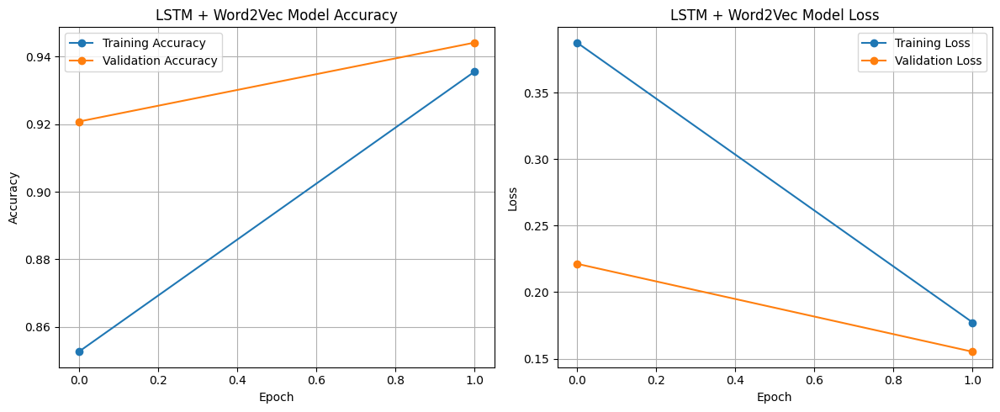

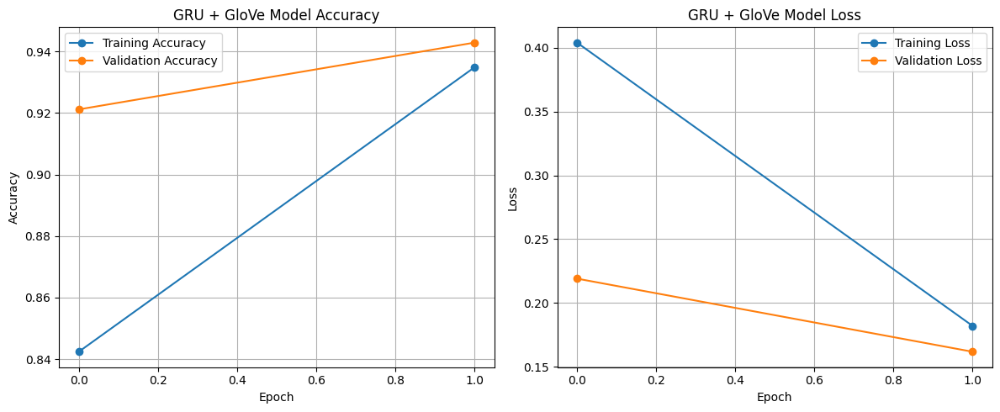

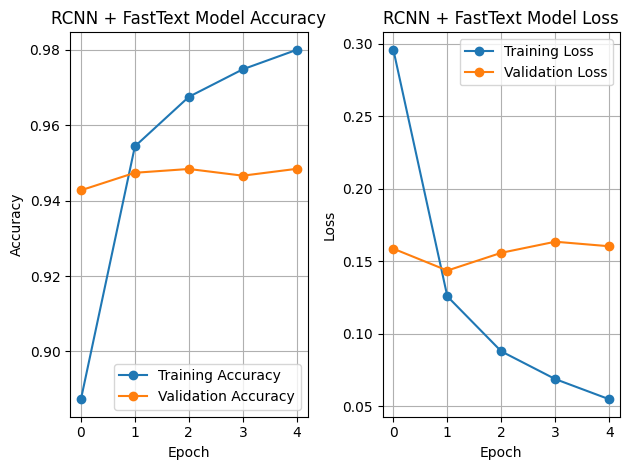

In [33]:
# Plotting Accuracy and Loss for LSTM + Word2Vec
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_lstm_w2v.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history_lstm_w2v.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('LSTM + Word2Vec Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history_lstm_w2v.history['loss'], label='Training Loss', marker='o')
plt.plot(history_lstm_w2v.history['val_loss'], label='Validation Loss', marker='o')
plt.title('LSTM + Word2Vec Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Plotting Accuracy and Loss for GRU + GloVe
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history_gru_glove.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history_gru_glove.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('GRU + GloVe Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history_gru_glove.history['loss'], label='Training Loss', marker='o')
plt.plot(history_gru_glove.history['val_loss'], label='Validation Loss', marker='o')
plt.title('GRU + GloVe Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# Plotting Accuracy and Loss for RCNN + Word2Vec
plt.subplot(1, 2, 1)
plt.plot(history_rcnn_fasttext.history['accuracy'], label='Training Accuracy', marker='o')
plt.plot(history_rcnn_fasttext.history['val_accuracy'], label='Validation Accuracy', marker='o')
plt.title('RCNN + FastText Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.subplot(1, 2, 2)
plt.plot(history_rcnn_fasttext.history['loss'], label='Training Loss', marker='o')
plt.plot(history_rcnn_fasttext.history['val_loss'], label='Validation Loss', marker='o')
plt.title('RCNN + FastText Model Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

# **7. Inference atau Testing dalam File**

## LSTM + Word2Vec

In [37]:
print("\n--- Testing with New Data ---")

with open('tokenizer.pkl', 'rb') as f:
    tokenizer = pickle.load(f)

with open('label_encoder.pkl', 'rb') as f:
    pickle.load(f)

loaded_model_LSTM = load_model('lstm_word2vec_model.h5')

new_texts = [
    "Aplikasi ini sangat Mantap, Mudah digunakan",
    "Aplikasi ini sangat buruk, banyak error dan membuat saya kesal",
    "sangat membantu, tetapi perlu di update dan tingkatkan lagi",
]

sequences = tokenizer.texts_to_sequences(new_texts)
padded = pad_sequences(sequences, maxlen=maxlen)
predictions = loaded_model_LSTM.predict(padded)
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = le.inverse_transform(predicted_classes)
for text, label in zip(new_texts, predicted_labels):
    print(f"Kalimat: {text}")
    print(f"Prediksi Sentimen: {label}")
    print('-'*50)


--- Testing with New Data ---


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 214ms/step
Kalimat: Aplikasi ini sangat Mantap, Mudah digunakan
Prediksi Sentimen: positive
--------------------------------------------------
Kalimat: Aplikasi ini sangat buruk, banyak error dan membuat saya kesal
Prediksi Sentimen: negative
--------------------------------------------------
Kalimat: sangat membantu, tetapi perlu di update dan tingkatkan lagi
Prediksi Sentimen: neutral
--------------------------------------------------


## GRU + GloVe

In [38]:
loaded_model_gru = load_model('gru_glove_model.h5')

new_texts = [
    "Aplikasi ini sangat Mantap, Mudah digunakan",
    "Aplikasi ini sangat buruk, banyak error dan membuat saya kesal",
    "sangat membantu, tetapi perlu di update dan tingkatkan lagi",
]

sequences = tokenizer.texts_to_sequences(new_texts)
padded = pad_sequences(sequences, maxlen=maxlen)
predictions = loaded_model_gru.predict(padded)
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = le.inverse_transform(predicted_classes)
for text, label in zip(new_texts, predicted_labels):
    print(f"Kalimat: {text}")
    print(f"Prediksi Sentimen: {label}")
    print('-'*50)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
Kalimat: Aplikasi ini sangat Mantap, Mudah digunakan
Prediksi Sentimen: positive
--------------------------------------------------
Kalimat: Aplikasi ini sangat buruk, banyak error dan membuat saya kesal
Prediksi Sentimen: negative
--------------------------------------------------
Kalimat: sangat membantu, tetapi perlu di update dan tingkatkan lagi
Prediksi Sentimen: neutral
--------------------------------------------------


## RCNN + FastText

In [39]:
loaded_model_rcnn = load_model('rcnn_fasttext_model.h5')

new_texts = [
    "Aplikasi ini sangat Mantap, Mudah digunakan",
    "Aplikasi ini sangat buruk, banyak error dan membuat saya kesal",
    "sangat membantu, tetapi perlu di update dan tingkatkan lagi",
]

sequences = tokenizer.texts_to_sequences(new_texts)
padded = pad_sequences(sequences, maxlen=maxlen)
predictions = loaded_model_rcnn.predict(padded)
predicted_classes = np.argmax(predictions, axis=1)
predicted_labels = le.inverse_transform(predicted_classes)
for text, label in zip(new_texts, predicted_labels):
    print(f"Kalimat: {text}")
    print(f"Prediksi Sentimen: {label}")
    print('-'*50)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
Kalimat: Aplikasi ini sangat Mantap, Mudah digunakan
Prediksi Sentimen: positive
--------------------------------------------------
Kalimat: Aplikasi ini sangat buruk, banyak error dan membuat saya kesal
Prediksi Sentimen: negative
--------------------------------------------------
Kalimat: sangat membantu, tetapi perlu di update dan tingkatkan lagi
Prediksi Sentimen: neutral
--------------------------------------------------
